# Some info on the dataset

 ## Context
Have you ever wondered when the best time of year to book a hotel room is? Or the optimal length of stay in order to get the best daily rate? What if you wanted to predict whether or not a hotel was likely to receive a disproportionately high number of special requests?

This hotel booking dataset can help you explore those questions!

## Content
This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things.

All personally identifying information has been removed from the data.

## Acknowledgements
The data is originally from the article Hotel Booking Demand Datasets, written by Nuno Antonio, Ana Almeida, and Luis Nunes for Data in Brief, Volume 22, February 2019.

The data was downloaded and cleaned by Thomas Mock and Antoine Bichat for #TidyTuesday during the week of February 11th, 2020.

## Inspiration
This data set is ideal for anyone looking to practice their exploratory data analysis (EDA) or get started in building predictive models!

If you're looking for inspiration on data visualizations, check out the #TidyTuesday program, a free, weekly online event that encourages participants to create and share their code and visualizations for a given data set on Twitter.

If you'd like to dive into predictive modeling, Julia Silge has an accessible and fantastic walk-through which highlights the tidymodels R package.


## Every column exlpained
hotel – Type of hotel (e.g., Resort Hotel or City Hotel).

is_canceled – Whether the booking was canceled (1 = Yes, 0 = No).

lead_time – Number of days between booking date and arrival date.

arrival_date_year – Year of arrival.

arrival_date_month – Month of arrival (e.g., January, February).

arrival_date_week_number – Week number of arrival (1–52).

arrival_date_day_of_month – Day of arrival (1–31).

stays_in_weekend_nights – Number of weekend nights (Saturday, Sunday) the guest stayed or booked to stay.

stays_in_week_nights – Number of weeknights (Monday–Friday) the guest stayed or booked to stay.

adults – Number of adults in the booking.

children – Number of children in the booking.

babies – Number of babies in the booking.

meal – Type of meal booked (e.g., BB = Bed & Breakfast, HB = Half board).

country – Country of origin of the guest (ISO 3-letter code, e.g., PRT = Portugal).

market_segment – Market segment designation (e.g., Direct, Corporate, Online TA).

distribution_channel – Booking distribution channel (e.g., TA/TO = Travel Agents/Tour Operators).

is_repeated_guest – Whether the guest has booked before (1 = Yes, 0 = No).

previous_cancellations – Number of previous bookings canceled by the customer.

previous_bookings_not_canceled – Number of previous bookings not canceled by the customer.

reserved_room_type – Room type initially reserved by the guest.

assigned_room_type – Room type actually assigned to the guest.

booking_changes – Number of changes made to the booking.

deposit_type – Type of deposit made (No Deposit, Non Refund, Refundable).

agent – ID of the travel agency that made the booking.

company – ID of the company that made the booking.

days_in_waiting_list – Number of days the booking was on the waiting list before being confirmed.

customer_type – Type of customer (Contract, Group, Transient, Transient-Party).

adr – Average Daily Rate (total price / number of nights stayed).

required_car_parking_spaces – Number of car parking spaces required by the guest.

total_of_special_requests – Total number of special requests (e.g., extra bed, high floor).

reservation_status – Final status of the booking (Canceled, Check-Out, No-Show).

reservation_status_date – Date the last reservation status was updated.

In [204]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from category_encoders import CountEncoder

In [129]:
df = pd.read_csv('/content/hotel_bookings.csv')
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [131]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,119390.0,0.370416,0.482918,0.00,0.00,0.000,1.0,1.0
lead_time,119390.0,104.011416,106.863097,0.00,18.00,69.000,160.0,737.0
arrival_date_year,119390.0,2016.156554,0.707476,2015.00,2016.00,2016.000,2017.0,2017.0
arrival_date_week_number,119390.0,27.165173,13.605138,1.00,16.00,28.000,38.0,53.0
arrival_date_day_of_month,119390.0,15.798241,8.780829,1.00,8.00,16.000,23.0,31.0
stays_in_weekend_nights,119390.0,0.927599,0.998613,0.00,0.00,1.000,2.0,19.0
stays_in_week_nights,119390.0,2.500302,1.908286,0.00,1.00,2.000,3.0,50.0
adults,119390.0,1.856403,0.579261,0.00,2.00,2.000,2.0,55.0
children,119386.0,0.103890,0.398561,0.00,0.00,0.000,0.0,10.0
babies,119390.0,0.007949,0.097436,0.00,0.00,0.000,0.0,10.0


In [132]:
df.isna().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [109]:
def column_info(df):
  print("Column Info:")
  for col in df.columns:
    print(f"Column: {col}")
    print(f"  Nunique : {df[col].nunique()}")
    print(f"  type: {df[col].dtype}")
    print(f"  nulls: {df[col].isnull().sum()}")
    print("-" * 20)
column_info(df)

Column Info:
Column: hotel
  Nunique : 2
  type: object
  nulls: 0
--------------------
Column: is_canceled
  Nunique : 2
  type: int64
  nulls: 0
--------------------
Column: lead_time
  Nunique : 479
  type: int64
  nulls: 0
--------------------
Column: arrival_date_year
  Nunique : 3
  type: int64
  nulls: 0
--------------------
Column: arrival_date_month
  Nunique : 12
  type: object
  nulls: 0
--------------------
Column: arrival_date_week_number
  Nunique : 53
  type: int64
  nulls: 0
--------------------
Column: arrival_date_day_of_month
  Nunique : 31
  type: int64
  nulls: 0
--------------------
Column: stays_in_weekend_nights
  Nunique : 17
  type: int64
  nulls: 0
--------------------
Column: stays_in_week_nights
  Nunique : 35
  type: int64
  nulls: 0
--------------------
Column: adults
  Nunique : 14
  type: int64
  nulls: 0
--------------------
Column: children
  Nunique : 5
  type: float64
  nulls: 4
--------------------
Column: babies
  Nunique : 5
  type: int64
  nulls

In [133]:
def show_unique_values(df, threshold=50):
  print(f"Unique values for columns with less than {threshold} unique values:")
  for col in df.columns:
    if df[col].nunique() < threshold:
      print(f"Column: {col}")
      print(f"  Unique values: {df[col].unique()}")
      print("-" * 20)

show_unique_values(df)

Unique values for columns with less than 50 unique values:
Column: hotel
  Unique values: ['Resort Hotel' 'City Hotel']
--------------------
Column: is_canceled
  Unique values: [0 1]
--------------------
Column: arrival_date_year
  Unique values: [2015 2016 2017]
--------------------
Column: arrival_date_month
  Unique values: ['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']
--------------------
Column: arrival_date_day_of_month
  Unique values: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]
--------------------
Column: stays_in_weekend_nights
  Unique values: [ 0  1  2  4  3  6 13  8  5  7 12  9 16 18 19 10 14]
--------------------
Column: stays_in_week_nights
  Unique values: [ 0  1  2  3  4  5 10 11  8  6  7 15  9 12 33 20 14 16 21 13 30 19 24 40
 22 42 50 25 17 32 26 18 34 35 41]
--------------------
Column: adults
  Unique values: [ 2  1  3  4 40 26 50 27 55  0 20  6  

In [186]:
def outlier_percent(df):
    outlier_info = {}

    for col in df.select_dtypes(include='number').columns:
        unique_vals = df[col].dropna().unique()
        if len(unique_vals) <= 5:
            continue

        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower) | (df[col] > upper)]
        percent = 100 * len(outliers) / len(df)

        outlier_info[col] = round(percent, 2)

    return pd.DataFrame.from_dict(outlier_info, orient='index', columns=['Outlier %'])

outlier_percent(df)

,Outlier %
lead_time,2.74
arrival_date_week_number,0.00
arrival_date_day_of_month,0.00
stays_in_weekend_nights,0.24
stays_in_week_nights,1.74
adults,26.06
previous_cancellations,1.93
previous_bookings_not_canceled,4.06
booking_changes,18.12
days_in_waiting_list,0.98


In [134]:
df.isna().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [137]:
df.duplicated().sum()

np.int64(0)

too much duplicated values i have to drop it before visualization

In [136]:
df.drop_duplicates(inplace=True)

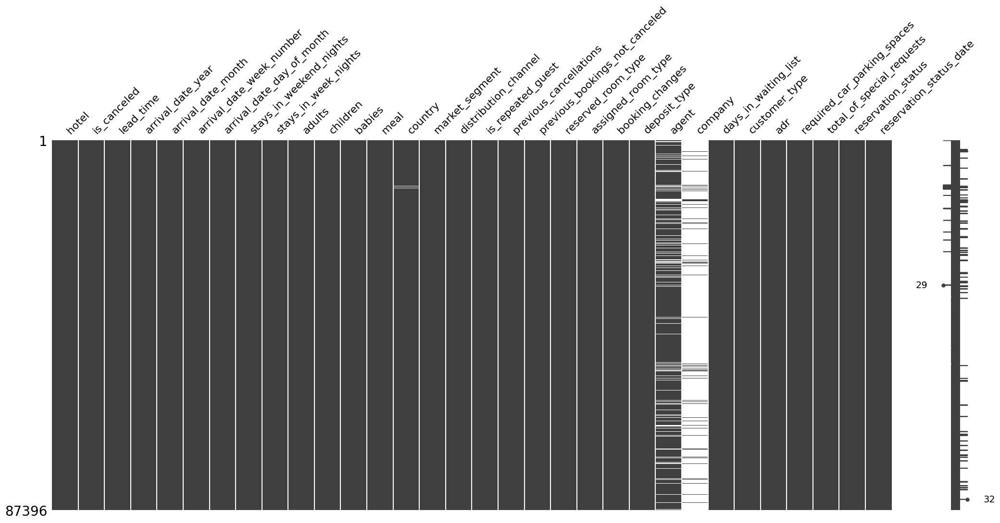

In [138]:
import missingno as msno
msno.matrix(df)
plt.show()

# Visualizations

Check outliers

In [157]:
def plot_numeric_boxplots_plotly(df):
    numeric_cols = df.select_dtypes(include=np.number).columns

    for col in numeric_cols:
        fig = px.box(df, y=col, title=f'Boxplot of {col}')
        fig.show()
plot_numeric_boxplots_plotly(df)

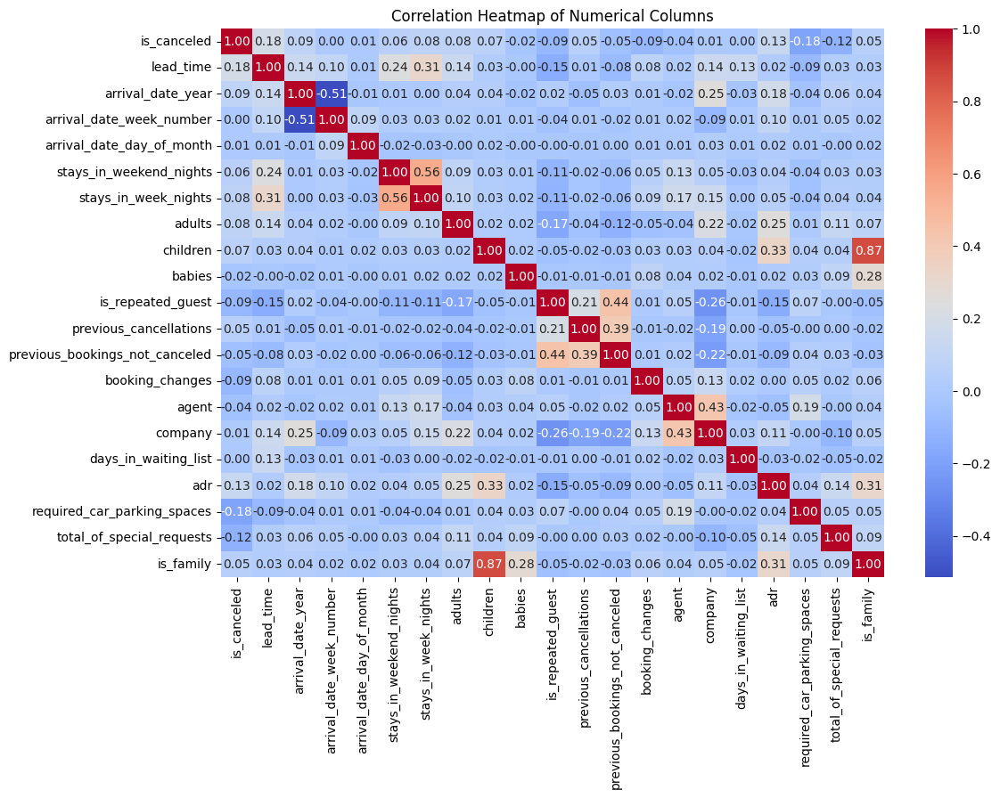

In [158]:
numeric = df.select_dtypes(include=np.number)
correlation_matrix = numeric.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Columns')
plt.show()

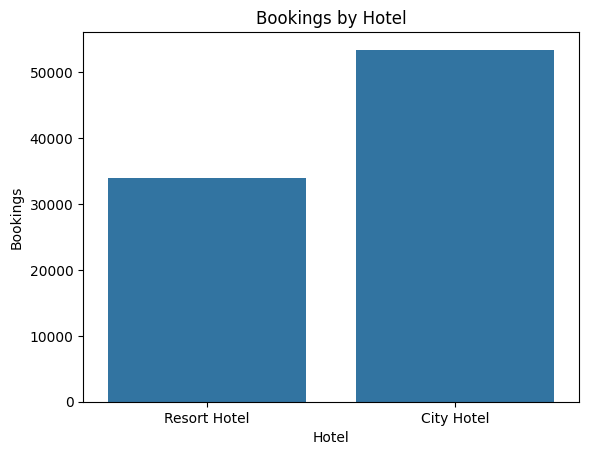

In [159]:
sns.countplot(data=df, x='hotel')
plt.title('Bookings by Hotel')
plt.xlabel('Hotel'),plt.ylabel('Bookings')
plt.show()

 the City Hotel consistently had more bookings than the Resort Hotel throughout the years

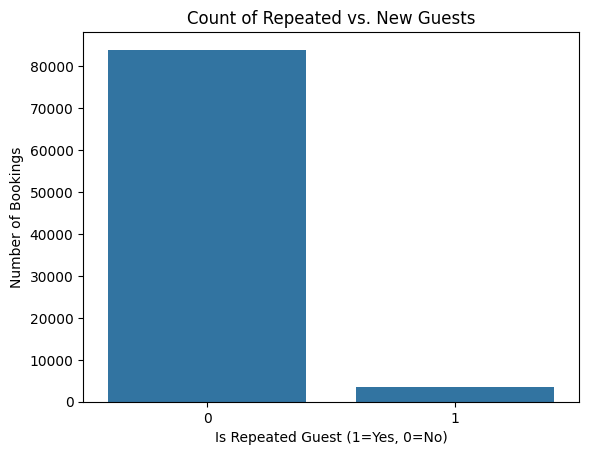

In [160]:
ax = sns.countplot(data=df, x='is_repeated_guest')
plt.title('Count of Repeated vs. New Guests')
plt.xlabel('Is Repeated Guest (1=Yes, 0=No)')
plt.ylabel('Number of Bookings')

#total = len(df['is_repeated_guest'])
#for p in ax.patches:
 #   percentage = '{:.1f}%'.format(100 * p.get_height()/total)
  #  x = p.get_x() + p.get_width() / 2.
   # y = p.get_height()
    #ax.annotate(percentage, (x, y), ha='center', va='bottom')

plt.show()

This shows that majority of the booking was from new guests that have never been to hotels before .Specifically, the plot  confirms that new guests approximately 96.8% of all bookings and repeated guests make up only about 3.2%

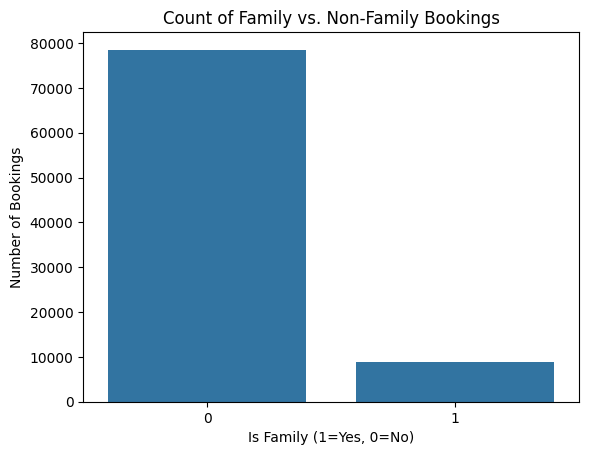

In [161]:
df['is_family'] = ((df['adults'] > 0) & ((df['children'] > 0) | (df['babies'] > 0))).astype(int)
sns.countplot(data=df, x='is_family')
plt.title('Count of Family vs. Non-Family Bookings')
plt.xlabel('Is Family (1=Yes, 0=No)')
plt.ylabel('Number of Bookings')
plt.show()

In [162]:
top_10_countries = df['country'].value_counts().nlargest(10).index
df_top_countries = df[df['country'].isin(top_10_countries)]

df_bar_data = df_top_countries.groupby(['country', 'hotel']).size().reset_index(name='count')

fig_bar = px.bar(df_bar_data, x='country', y='count',color='hotel',
                 barmode='group',text_auto=True,
                 color_discrete_map=color_map,
                 title='<b>Top 10 Countries by Number of Bookings</b>',
                 labels={'country': 'Country', 'count': 'Number of Bookings'},
                 category_orders={'country': top_10_countries})

fig_bar.show()

Nearly 46% of the bookings are from Portugal and The only country in the top 10 outside Europe is Brazil

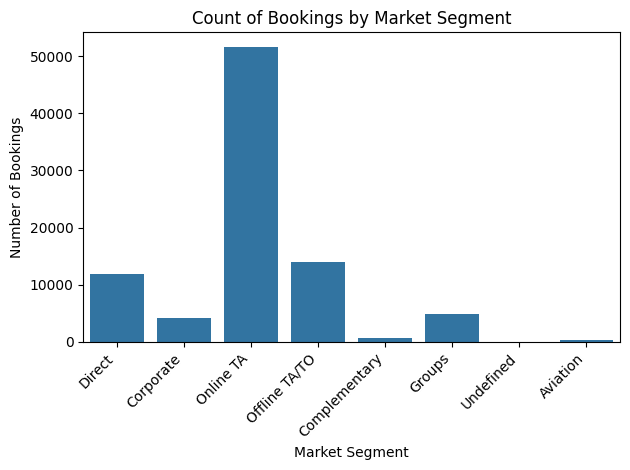

In [163]:
sns.countplot(data=df, x='market_segment')
plt.title('Count of Bookings by Market Segment')
plt.xlabel('Market Segment')
plt.ylabel('Number of Bookings')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Most of bookings are from online travel agent and shows tha5t offline travel agencies and groups are also an effectively source of guests

In [164]:
fig = px.scatter(df,
                 x='previous_cancellations',
                 y='previous_bookings_not_canceled',
                 color='is_canceled',
                 title='Previous Cancellations vs. Previous Non-Canceled Bookings by Current Booking Status',
                 labels={'previous_cancellations': 'Number of Previous Cancellations',
                         'previous_bookings_not_canceled': 'Number of Previous Non-Canceled Bookings',
                         'is_canceled': 'Current Booking Canceled (1=Yes, 0=No)'})

fig.show()

This shows strong connection between a customer's booking history and their cancellation. The plot shows that bookings made by guests with at least one previous cancellation have an extremely high cancellation rate of over 90

/tmp/ipython-input-1690837964.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<function matplotlib.pyplot.show(close=None, block=None)>

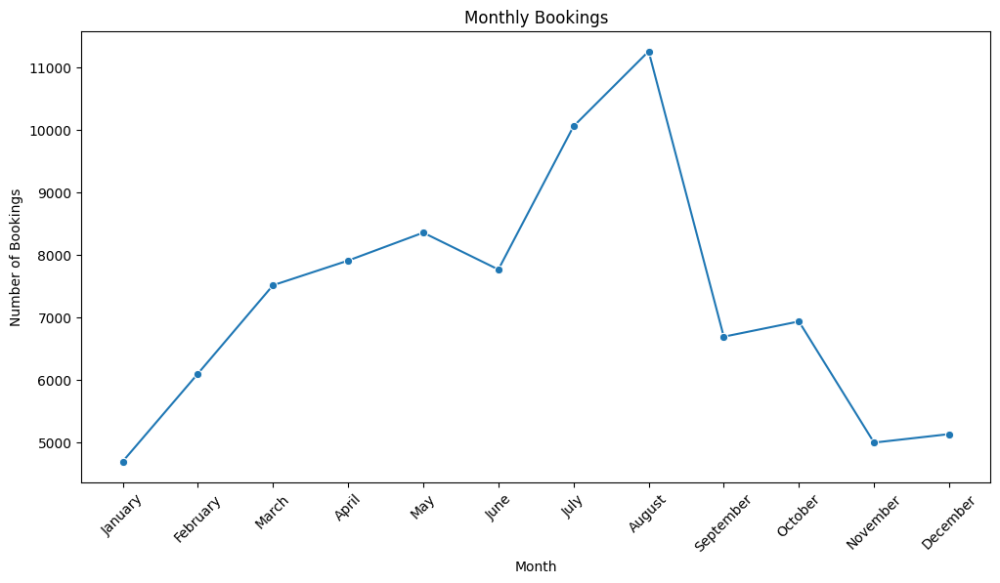

In [165]:
df["arrival_date_month"] = pd.Categorical(df["arrival_date_month"],
                                        categories=["January", "February", "March", "April", "May", "June",
                                                    "July", "August", "September", "October", "November", "December"],
                                        ordered=True)
monthly_bookings = df.groupby("arrival_date_month").size().reset_index(name="count")
plt.figure(figsize=(12, 6))
sns.lineplot(x="arrival_date_month", y="count", data=monthly_bookings, marker="o")
plt.title("Monthly Bookings")
plt.xlabel("Month")
plt.ylabel("Number of Bookings")
plt.xticks(rotation=45)
plt.show

Summer monthes "the trird quarter" clearly has more bookings in the years and August surpassed every other month

In [166]:
plt = px.histogram(df, x="hotel", color="is_canceled", barmode="group",
                    category_orders={"is_canceled":[0,1]},
                    labels={"is_canceled":"Canceled (0=No, 1=Yes)"},
                    title="Cancellation Distro by Hotel Type")
plt.show()

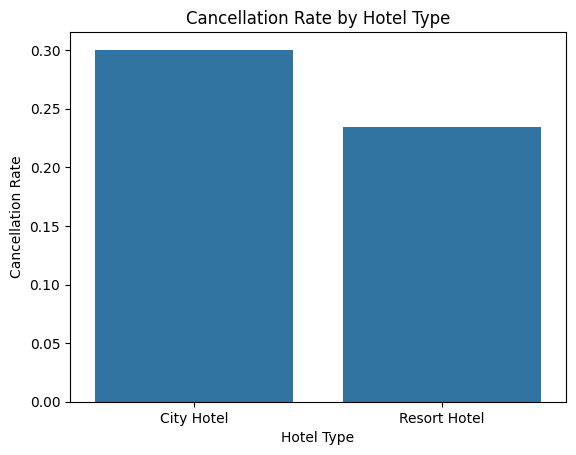

In [175]:
cancellation_by_hotel = df.groupby("hotel")["is_canceled"].mean().reset_index()
sns.barplot(x="hotel", y="is_canceled", data=cancellation_by_hotel)
plt.title("Cancellation Rate by Hotel Type")
plt.xlabel("Hotel Type")
plt.ylabel("Cancellation Rate")
plt.show()

Cancellations rates are clearly expected cause the difference between the city and resort booking count likely due to flexible city stays vs. planned resort vacations

In [169]:
fig = px.box(df,
             x="hotel",
             y="adr",
             color="is_canceled", # Color by cancellation status
             title="ADR by Hotel Type and Cancellation Status",
             labels={"hotel": "Hotel Type", "adr": "Average Daily Rate", "is_canceled": "Canceled (1=Yes, 0=No)"})

fig.show()

City Hotels generally have lower ADR but higher variability and Resort Hotels show more stable pricing, but ADR can spike in peak season.

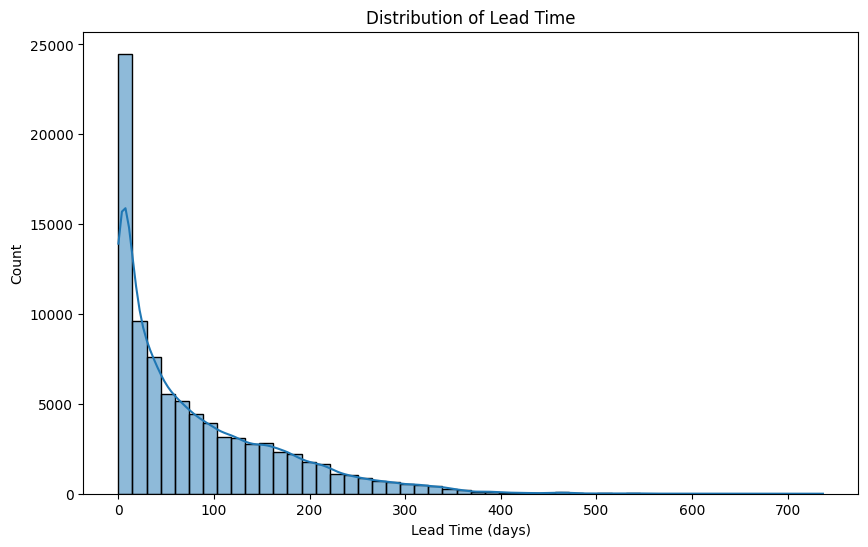

In [174]:
plt.figure(figsize=(10, 6))
sns.histplot(df["lead_time"], bins=50, kde=True)
plt.title("Distribution of Lead Time")
plt.xlabel("Lead Time (days)")
plt.ylabel("Count")
plt.show()

ost bookings are made close to the arrival date short lead time but there is share of reservations are made too far from the advance

# My Takes on the dataset


## Hotel Bookings Dataset Analysis

This report summarizes the analysis of the Hotel Bookings dataset.
The objective was to identify booking patterns and cancellation behavior through visualizations (Seaborn & Plotly). The findings provide insights to support better pricing, marketing, and operational strategies.

Data Overview & Quality Check

Dataset Shape: 119,390 rows × 32 columns.

Missing Values:

children, country, agent, and company contain missing values, with company being the sparsest field.

Duplicate Records:

The dataset contains 31,992 exact duplicate rows.

These duplicates can inflate statistics and bias insights if not handled. They should be dropped during preprocessing to ensure accuracy.

Key Findings & Insights
1. Cancellation Rate by Hotel Type

City Hotels exhibit a significantly higher cancellation rate compared to Resort Hotels.

Likely explanation: City stays are shorter and more flexible, while Resort bookings are more planned and committed.

2. Monthly Booking Trends

Clear seasonality exists in booking behavior.

Summer months (July–August) show peak demand.

Winter months (November–February) experience reduced booking activity.

Hotels can align marketing campaigns and staffing with these seasonal fluctuations.

3. Average Daily Rate (ADR) by Hotel Type

City Hotels generally offer lower ADRs but with greater price variability.

Resort Hotels maintain more stable rates but experience spikes during peak demand periods.

This reflects different pricing strategies: City Hotels compete on flexibility, while Resorts capitalize on holiday demand.

4. Special Requests vs. Cancellation Likelihood

Guests making more special requests tend to cancel less frequently.

This shows that customization requests reflect stronger booking commitment.

Encouraging special requests could be a strategy to reduce cancellations.

5. Lead Time Distribution

Lead time (days between booking and arrival) shows a skewed distribution:

The majority of bookings occur close to arrival dates (short-term planners).

A substantial number of reservations are made months in advance (long-term planners).

This indicates two distinct guest profiles: last-minute travelers vs. early planners.

Conclusion

The analysis reveals consistent trends in booking behavior and customer decision-making:

City Hotels face higher cancellation risks, while Resort Hotels benefit from more reliable demand.

Seasonality drives booking volumes, with summer peaks and winter declines.

Pricing strategies vary, with City Hotels showing higher volatility than Resort Hotels.

Guest engagement through special requests reduces cancellation risks.

Lead times highlight two key customer types: spontaneous and advance planners.

# Data Cleaning


In [177]:
df.duplicated().sum()

np.int64(0)

In [178]:
df.isna().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


## handle missing values

In [180]:
df["agent"].fillna('none', inplace=True)
df["company"].fillna('none', inplace=True)
df.isna().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [211]:
df['country'].fillna(df['country'].mode(), inplace=True)
df["children"].fillna(0, inplace=True)
df.isna().sum()

/tmp/ipython-input-1638514505.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipython-input-1638514505.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or d

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,87230
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [183]:
df.shape

(87396, 33)

In [185]:
# 0 human of course = no booking
df = df[df["adults"] + df["children"] + df["babies"] > 0]
df.shape

(87230, 33)

## Cap the outliers

its the first time to use capping so if i am wrong the code the i offten use will be underneath

def remove_outliers_iqr(df, column, multiplier=1.5):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR


    filtered_df = df[
        df[column].isna() |
        ((df[column] >= lower_bound) & (df[column] <= upper_bound))
    ]

    return filtered_df

    df = remove_outliers_iqr(df, the column')

In [189]:
df["adr"] = np.where(df["adr"] > 1000, 1000, df["adr"])
df["lead_time"] = np.where(df["lead_time"] > 365, 365, df["lead_time"])

# Feature Engineering & Preprocessing


In [201]:
df["total_guests"] = df["adults"] + df["children"] + df["babies"]
df["total_nights"] = df["stays_in_weekend_nights"].fillna(0) + df["stays_in_week_nights"].fillna(0)
df["is_family"] = df.apply(lambda x: "Yes" if (x["children"] > 0 or x["babies"] > 0) else "No", axis=1)

## Encode

In [206]:
cols = df.select_dtypes(include=["object", "category"]).columns.tolist()
low_cols = [col for col in cols if df[col].nunique() <= 15]
df_encoded = pd.get_dummies(df, columns=low_cols, drop_first=True)

In [207]:
encoder = CountEncoder(normalize=True)  # normalize=True gives frequency instead of raw counts
df["country_en"] = encoder.fit_transform(df["country"])

# DAta splitting

In [210]:
x = df_encoded.drop('is_canceled', axis=1)
y = df_encoded['is_canceled']


x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.2, random_state=42)

print("Data splited")

Data splited
